## Unsupervised Activation Energy

This script is inspired from this paper:

Elham Saraee, Mona Jalal, Margrit Betke, Visual complexity analysis using deep intermediate-layer features, Computer Vision and Image Understanding,Volume 195,2020,102949,ISSN 1077-3142,
https://doi.org/10.1016/j.cviu.2020.102949.
https://www.sciencedirect.com/science/article/pii/S1077314220300333

The process basically consists in the following steps:
* load a pre-trained neural network, in this case VGG16, which is acknowledged as a performing network for visual perception. The pre-trained model is available in the Keras library from Tensorflow, a popular Python library for deep learning: it is trained on the ImageNet dataset, maybe the most popular image data bank for image labelling and segmentation (https://www.image-net.org/index.php).
* apply the model to the set of images of which you want to inspect the visual complexity, by resizing them (or padding them) to the input size needed by the pre-trained network.
* average over all values of the receptive fields and all the channels in a layer of the network. In the cited paper (figure 3), the fourth max-pooling layer in the VGG-16 (that corresponds to ordinal number 14, starting from 0) is identified as the most correlated with visual complexity from experimental evidence.
* this average is called Unsupervised Activation Energy (UAE) and corresponds to the activation of certain neurons in the network, that represent increasingly complex visual features (by progressing in the layer order).
* UAE is a proxy for visual complexity, especially when applied on some layers.

One aspect I find interesting, is that the network has not been trained to detect complexity, not at all: it has been trained to label and segment objects in the image, while complexity is an information that lies in the neurons' layers, so basically in the background of the detection process. Complexity is a by-product of the detection process.

here we import the necessary libraries

In [1]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import inspect
from tqdm import tqdm
import os
from tensorflow.keras import backend as K
import scipy.interpolate as interp

here we load the input folder with the images of the cityscapes, to be classified by the model

In [2]:
data_dir=r'H:\Il mio Drive\EPFL\_RESEARCH\CRENAU\Photos\Saliency\Collection\crop\unedited'
data_dir1=r'H:\Il mio Drive\EPFL\_RESEARCH\CRENAU\Photos\Saliency\Collection\crop\unedited\files'
batch_size=50

printout of the files list

In [3]:
files=[]
for filename in os.listdir(data_dir1):
    if filename.endswith('.jpg') or filename.endswith('.jpeg'):
        files.append(os.path.join(data_dir1,filename))
filesdf=pd.DataFrame(files,columns=['filename'])
filesdf['label']=np.nan
filesdf['uae']=np.nan
filesdf['uaemap']=np.nan
files

['H:\\Il mio Drive\\EPFL\\_RESEARCH\\CRENAU\\Photos\\Saliency\\Collection\\crop\\unedited\\files\\image_38a.jpg',
 'H:\\Il mio Drive\\EPFL\\_RESEARCH\\CRENAU\\Photos\\Saliency\\Collection\\crop\\unedited\\files\\image_01a.jpg',
 'H:\\Il mio Drive\\EPFL\\_RESEARCH\\CRENAU\\Photos\\Saliency\\Collection\\crop\\unedited\\files\\image_02a.jpg',
 'H:\\Il mio Drive\\EPFL\\_RESEARCH\\CRENAU\\Photos\\Saliency\\Collection\\crop\\unedited\\files\\image_03a.jpg',
 'H:\\Il mio Drive\\EPFL\\_RESEARCH\\CRENAU\\Photos\\Saliency\\Collection\\crop\\unedited\\files\\image_04a.jpg',
 'H:\\Il mio Drive\\EPFL\\_RESEARCH\\CRENAU\\Photos\\Saliency\\Collection\\crop\\unedited\\files\\image_05a.jpg',
 'H:\\Il mio Drive\\EPFL\\_RESEARCH\\CRENAU\\Photos\\Saliency\\Collection\\crop\\unedited\\files\\image_06a.jpg',
 'H:\\Il mio Drive\\EPFL\\_RESEARCH\\CRENAU\\Photos\\Saliency\\Collection\\crop\\unedited\\files\\image_07a.jpg',
 'H:\\Il mio Drive\\EPFL\\_RESEARCH\\CRENAU\\Photos\\Saliency\\Collection\\crop\\unedite

here we load the VGG16 model from the Keras library. The layer we are interested in for averaging the values is _block4_pool_ as it is found to be the one that best correlates with human perception of visual complexity. It is number 14 from the beginning, starting from 0.

In [4]:
from tensorflow.keras.applications.vgg16 import VGG16
# load model
model = VGG16()
# summarize the model
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

here we change the type of the dataframe holding the files list, to make it able to contain arrays

In [5]:
filesdf=filesdf.astype('object')

in this loop:
* we resize the images to the necessary shape 224 x 224 pixels, needed by the pretrained network, 
* we re-order the image bands to meet the Keras requirements and pre-process it to rescale the pixel values from the range 0-255 to the range needed by the network (I guess 0-100).
* we predict (classify) the image labels based on the training ImageNet dataset
* we turn labels into a readable format and store the most likely one in the dataframe in the column "label"
* we collect and average the value of the 14th layer in the network, then store this variable in the dataframe column "uae"
* we average the 14th layer values over the z-axis of the array, to obtain a map of the image UAE, then store the variable in the dataframe column "uaemap"

In [6]:
for index,row in filesdf.iterrows():
    image = tf.keras.preprocessing.image.load_img(row['filename'], target_size=(224, 224))
    # convert the image pixels to a numpy array
    image1 = tf.keras.preprocessing.image.img_to_array(image)
    # reshape data for the model
    image2 = image1.reshape((1, image1.shape[0], image1.shape[1], image1.shape[2]))
    # prepare the image for the VGG model
    image3 = tf.keras.applications.vgg16.preprocess_input(image2)
    # predict the probability across all output classes
    yhat = model.predict(image3)
    # convert the probabilities to class labels
    label = tf.keras.applications.imagenet_utils.decode_predictions(yhat)
    # retrieve the most likely result, e.g. highest probability
    filesdf.loc[index,'label'] = [label[0][0]]
    # create a Keras function to get i-th layer
    get_layer_output = K.function(inputs =  model.layers[0].input, outputs = model.layers[14].output)
    # extract output
    layer_output = get_layer_output(image3)
    filesdf.loc[index,'uae']=np.average(layer_output)
    filesdf.loc[index,'uaemap']=np.average(layer_output,axis=3)
filesdf

,filename,label,uae,uaemap
0,H:\Il mio Drive\EPFL\_RESEARCH\CRENAU\Photos\S...,"[(n03447447, gondola, 0.9987404)]",67.857071,"[[[79.76851, 95.15926, 85.58649, 78.13426, 37...."
1,H:\Il mio Drive\EPFL\_RESEARCH\CRENAU\Photos\S...,"[(n03895866, passenger_car, 0.38739732)]",46.014694,"[[[58.585, 68.100075, 71.13285, 66.48297, 40.0..."
2,H:\Il mio Drive\EPFL\_RESEARCH\CRENAU\Photos\S...,"[(n03877845, palace, 0.18089375)]",73.781029,"[[[130.52364, 130.88544, 161.7612, 95.9061, 60..."
3,H:\Il mio Drive\EPFL\_RESEARCH\CRENAU\Photos\S...,"[(n03028079, church, 0.42757672)]",68.406097,"[[[91.43871, 94.996376, 92.501205, 107.637054,..."
4,H:\Il mio Drive\EPFL\_RESEARCH\CRENAU\Photos\S...,"[(n02930766, cab, 0.8316127)]",78.755219,"[[[124.72104, 81.3627, 72.86872, 86.187836, 80..."
5,H:\Il mio Drive\EPFL\_RESEARCH\CRENAU\Photos\S...,"[(n03028079, church, 0.20337483)]",74.54451,"[[[179.71623, 91.320816, 41.189198, 27.100437,..."
6,H:\Il mio Drive\EPFL\_RESEARCH\CRENAU\Photos\S...,"[(n03781244, monastery, 0.4671728)]",60.237354,"[[[39.144028, 18.392025, 14.138247, 13.209689,..."
7,H:\Il mio Drive\EPFL\_RESEARCH\CRENAU\Photos\S...,"[(n03781244, monastery, 0.29071262)]",55.152576,"[[[114.98999, 109.51485, 99.23407, 55.833603, ..."
8,H:\Il mio Drive\EPFL\_RESEARCH\CRENAU\Photos\S...,"[(n03417042, garbage_truck, 0.3376718)]",72.443115,"[[[84.07077, 138.70972, 146.28418, 97.89961, 9..."
9,H:\Il mio Drive\EPFL\_RESEARCH\CRENAU\Photos\S...,"[(n02825657, bell_cote, 0.21705475)]",48.526093,"[[[64.31151, 88.802246, 102.398575, 68.98714, ..."


here we show some stats of the uae column, the min, the mean and the max:

In [7]:
filesdf['uae'].min(),filesdf['uae'].mean(),filesdf['uae'].max()

(42.73314, 58.82120554070724, 79.13176)

### Plotting
In this section, we plot the resized images and the UAE map for each file, with the mean on top

<ipython-input-8-d8d0a903eab9>:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(20, 6))


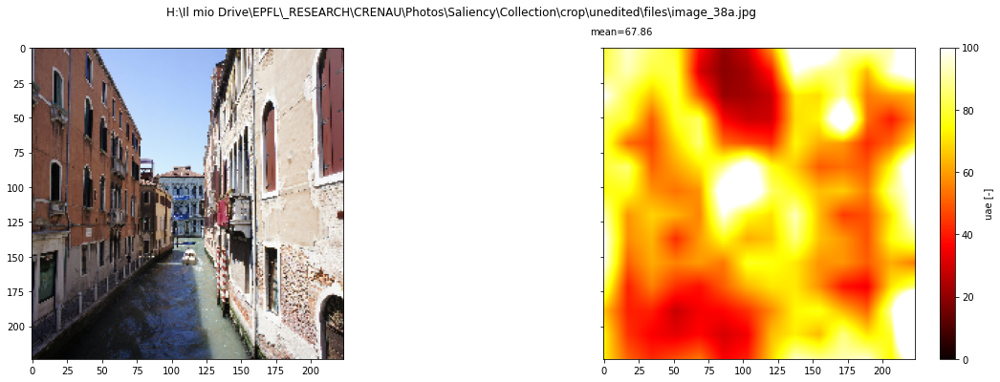

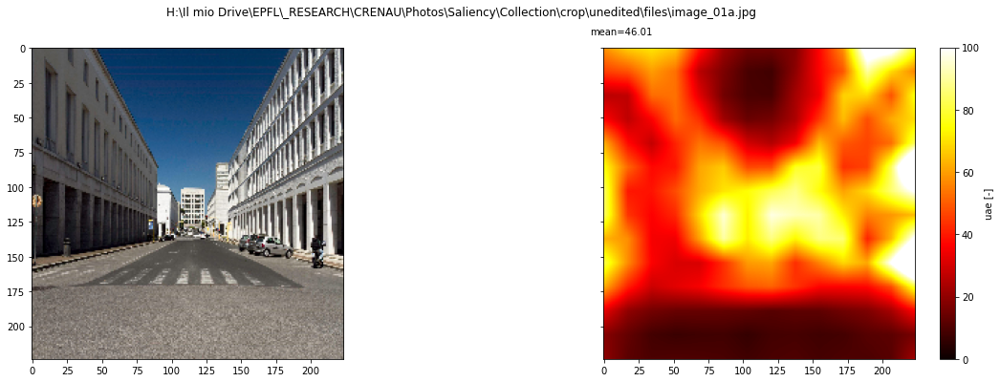

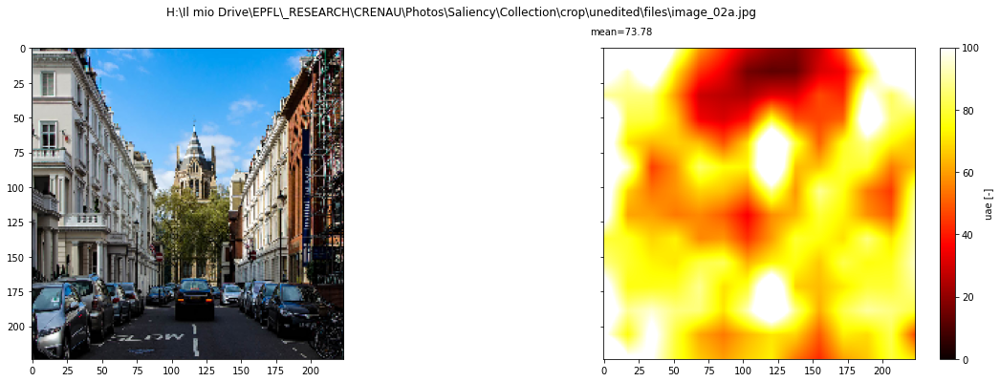

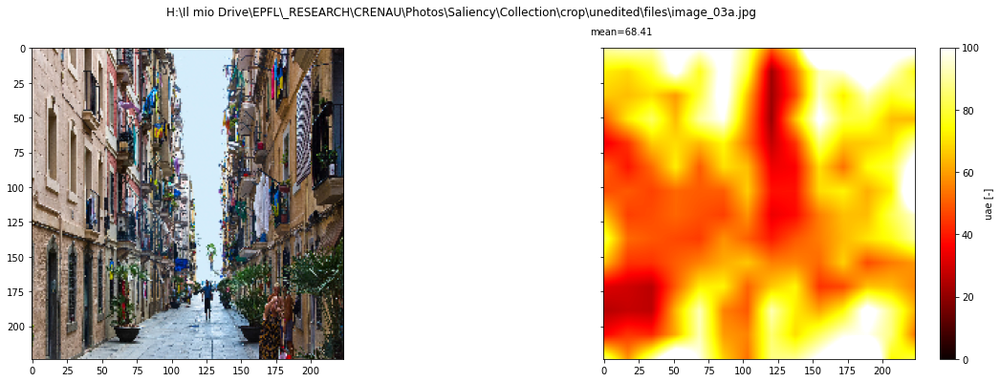

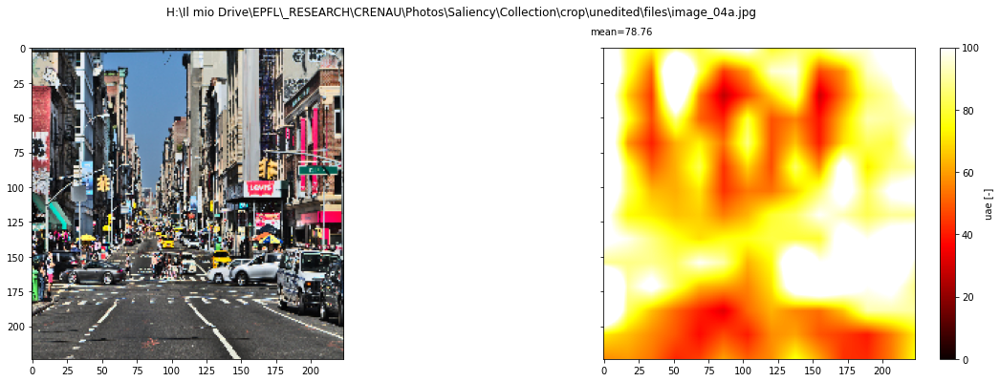

...

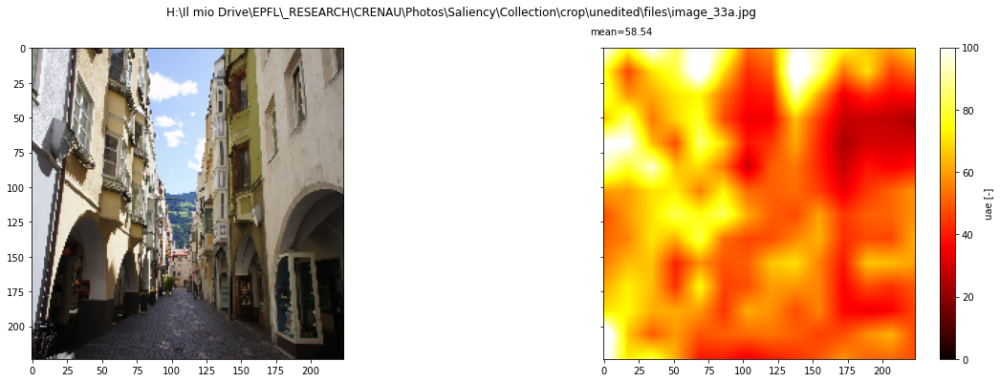

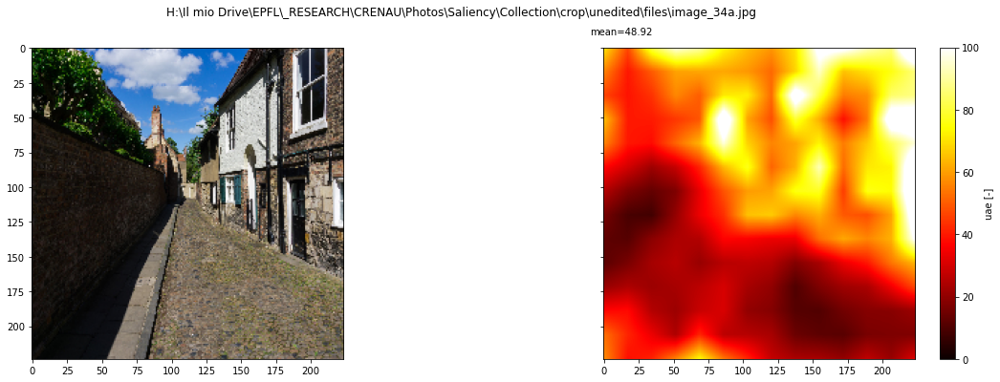

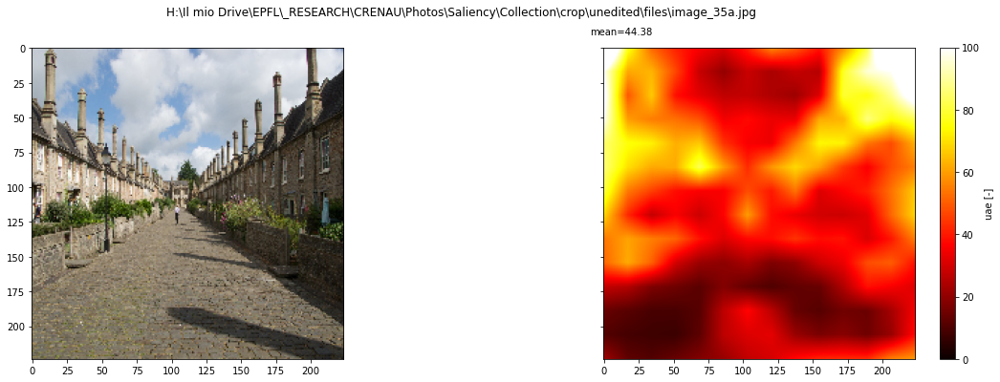

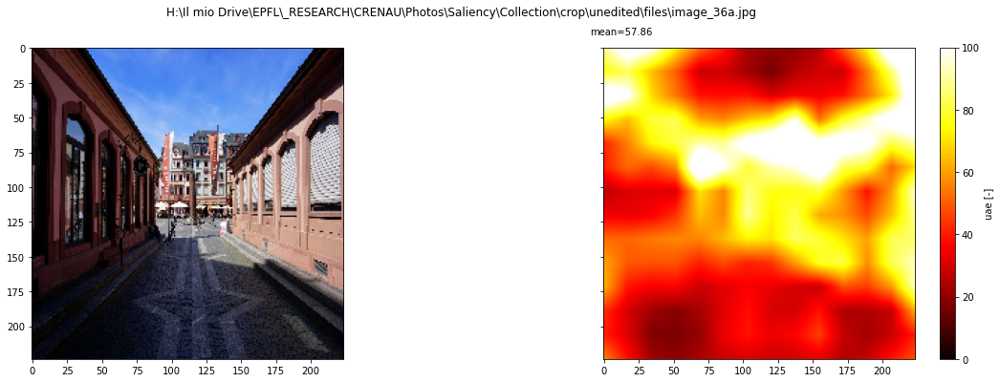

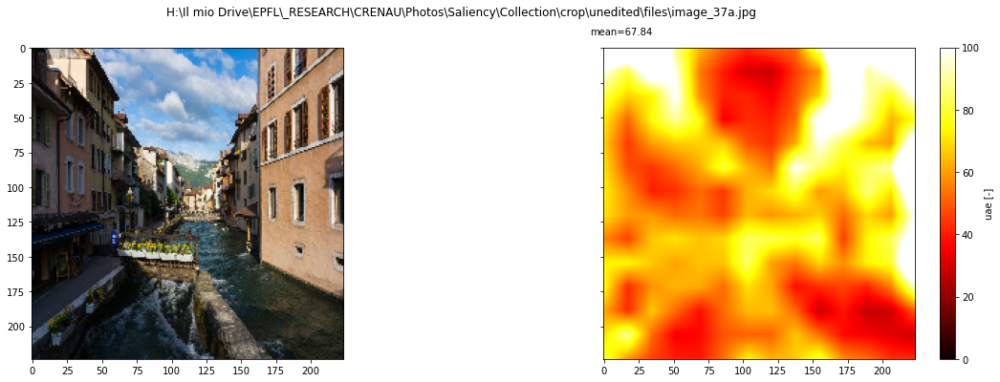

In [8]:
for index,row in filesdf.iterrows():
    W, H = row['uaemap'].shape[-2:]
    new_W, new_H = (224,224)
    xrange = lambda x: np.linspace(0, 1, x)

    f = interp.interp2d(xrange(W), xrange(H), row['uaemap'][-2:], kind="linear")
    new_arr = f(xrange(new_W), xrange(new_H))
    
    image = tf.keras.preprocessing.image.load_img(row['filename'], target_size=(224, 224))
    
    fig, (ax1, ax2) = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(20, 6))
    fig.suptitle(row['filename'])
    ax1.imshow(image)
    p=ax2.imshow(new_arr, vmin=0, vmax=100, cmap='hot')
    ax2.text(-10,-10,'mean='+str(round(row['uae'],2)))
    fig.colorbar(p, ax=ax2, label='uae [-]')

there seem to be quite a good correlation with human-ranked complexity, at a first glance

### Output
Here we save the dataframe to an output Excel file

In [9]:
filesdf.to_excel(r'H:\Il mio Drive\EPFL\_RESEARCH\CRENAU\Photos\Saliency\Collection\uae_ranking.xlsx')

# Old
These are old cells that may be useful, if the approach is deemed of an interest, to replicate it to other pre-trained networks in Keras

In [ ]:
print(data_dir)

In [ ]:
images=tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  image_size=(1796, 1350),
  batch_size=batch_size,
  label_mode=None,
  validation_split=None)

In [ ]:
def normalize_img(image, img_size):
    # Resize image to the desired img_size and normalize it
    image = tf.image.resize(image, img_size)
    image = tf.cast(image, tf.float32) / 255.
    return image
    
def preprocess_data(dataset, batch_size, img_size):
    
    processed = dataset.map(lambda image: normalize_img(image, img_size))
    
    # If your data is already batched (eg, when using the image_dataset_from_directory function), remove .batch(batch_size)
    processed = processed.batch(batch_size)
    
    return processed

In [ ]:
# Run preprocessing
processed_224= preprocess_data(images, batch_size, img_size=[224,224])
processed_331= preprocess_data(images, batch_size, img_size=[331,331])

In [ ]:
processed_331

In [ ]:
# List all available models
model_dictionary = {m[0]:m[1] for m in inspect.getmembers(tf.keras.applications, inspect.isfunction)}
model_dictionary

In [ ]:
# Loop over each model available in Keras
model_benchmarks = {'model_name': [], 'num_model_params': [], 'validation_accuracy': []}

for model_name, model in tqdm(model_dictionary.items()):
    # Special handling for "NASNetLarge" since it requires input images with size (331,331)
    if 'NASNetLarge' in model_name:
        input_shape=(331,331,3)
        processed = processed_331
    else:
        input_shape=(224,224,3)
        processed = processed_224
        
    # load the pre-trained model with global average pooling as the last layer and freeze the model weights
    pre_trained_model = model(include_top=False, pooling='avg', input_shape=input_shape)
    pre_trained_model.trainable = False
    
    # predict from pre-trained model
    pre_trained_model.predict(processed)